In [64]:
label_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
import pickle
import numpy as np
import os
from scipy.misc import imread
def load_CIFAR_one(filename):
    with open(filename, 'rb') as f:
        datadict = pickle.load(f, encoding='latin1')
        X = datadict['data']
        Y = datadict['labels']
        Y = np.array(Y)
        return X, Y
def load_CIFAR10(PATH):
    xs = []
    ys = []
    for b in range(1,6):
        f = os.path.join(PATH, 'data_batch_%d' % (b, ))
        X, Y = load_CIFAR_one(f)
        xs.append(X)
        ys.append(Y)
    Xtr = np.concatenate(xs)
    Ytr = np.concatenate(ys)
    #add your Xval
    del X, Y
    Xte, Yte = load_CIFAR_one(os.path.join(PATH, 'test_batch'))
    return Xtr, Ytr, Xte, Yte

x_train, y_train, x_test, y_test_n = load_CIFAR10('cifar-10-batches-py')

import keras
x_train = x_train.reshape((x_train.shape[0],3,32,32))
x_train = x_train.transpose([0, 2, 3, 1]) #only if 'tf' dim-ordering is to be used
x_test= x_test.reshape((x_test.shape[0],3,32,32))
x_test= x_test.transpose([0, 2, 3, 1])#remove if 'th' dim-ordering is to be used
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test_n, 10)

x_train = x_train/255
x_test = x_test/255

msk = np.random.rand(len(x_train)) < 0.9
x_train_1 = x_train[msk]
x_val = x_train[~msk]
y_train_1 = y_train[msk]
y_val = y_train[~msk]

x_train = x_train_1
y_train = y_train_1

#with open('x_4.pickle', 'wb') as handle:
    #pickle.dump(list([x_train, x_val, x_test]), handle, protocol=pickle.HIGHEST_PROTOCOL)
#with open('y_4.pickle', 'wb') as handle:
    #pickle.dump(list([y_train, y_val, y_test]), handle, protocol=pickle.HIGHEST_PROTOCOL)

In [65]:
import numpy as np
import pickle

with open('x_4.pickle', 'rb') as handle:
    x_train, x_val, x_test = pickle.load(handle)
with open('y_4.pickle', 'rb') as handle:
    y_train, y_val, y_test = pickle.load(handle)

In [76]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
activation_11 (Activation)   (None, 32, 32, 64)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 16, 16, 64)        36928     
_________________________________________________________________
activation_12 (Activation)   (None, 16, 16, 64)        0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 4096)              0         
__________

c) En el detalle se puede ver

In [77]:
from keras.optimizers import SGD, rmsprop
from keras.callbacks import LearningRateScheduler
import math
def step_decay(epoch):
    initial_lrate = 0.001
    lrate = initial_lrate * math.pow(0.5, math.floor((1+epoch)/5))
    lrate = max(lrate,0.00001)
    return lrate
opt = SGD(lr=0.0, momentum=0.9, decay=0.0)
lrate = LearningRateScheduler(step_decay)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

metrics_list_train = list()
metrics_list_test = list()
for i in range(25):
    model.fit(x_train, y_train,batch_size=32,epochs=1, validation_data=(x_test,y_test), shuffle=True, callbacks=[lrate])
    metrics_list_train.append(model.evaluate(x_train, y_train))
    metrics_list_test.append(model.evaluate(x_test, y_test))

Train on 44931 samples, validate on 10000 samples
Epoch 1/1
10000/10000 [==============================] - 2s 159us/step

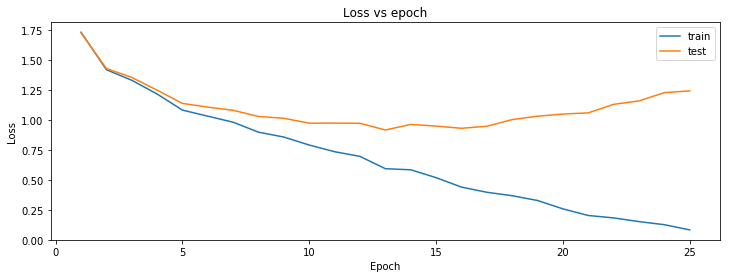

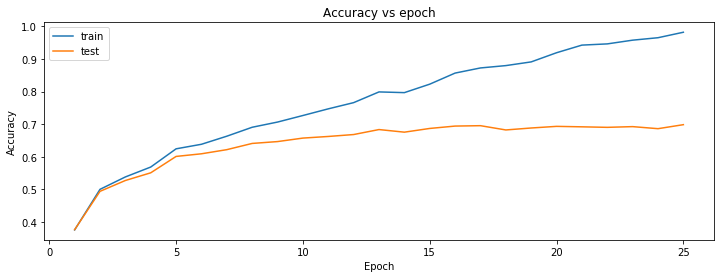

In [80]:
acc_train_list = list()
acc_test_list = list()
loss_train_list = list()
loss_test_list = list()
for i in range(len(metrics_list_test)):
    acc_train_list.append(metrics_list_train[i][1])
    acc_test_list.append(metrics_list_test[i][1])
    loss_train_list.append(metrics_list_train[i][0])
    loss_test_list.append(metrics_list_test[i][0])
    
import matplotlib.pyplot as plt    
n_epoch = list(range(1,26))
fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, loss_train_list, '-', label='train')
plt.plot(n_epoch, loss_test_list, '-', label='test')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs epoch')
plt.show()

fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, acc_train_list, '-', label='train')
plt.plot(n_epoch, acc_test_list, '-', label='test')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs epoch')
plt.show()

In [6]:
from keras.optimizers import SGD, rmsprop
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))

opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

metrics_list_train = list()
metrics_list_test = list()
for i in range(25):
    model.fit(x_train, y_train, batch_size=32, epochs=1, validation_data=(x_val, y_val), shuffle=True)
    metrics_list_train.append(model.evaluate(x_train, y_train))
    metrics_list_test.append(model.evaluate(x_test, y_test))

Train on 45017 samples, validate on 4983 samples
Epoch 1/1
10000/10000 [==============================] - 2s 190us/step

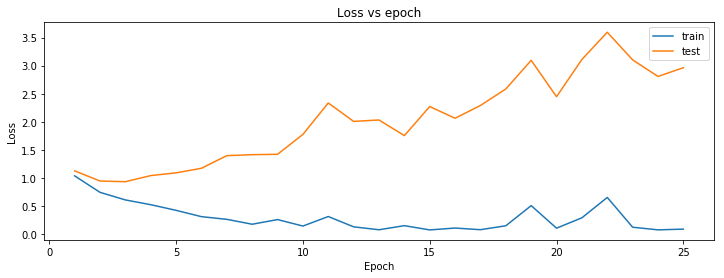

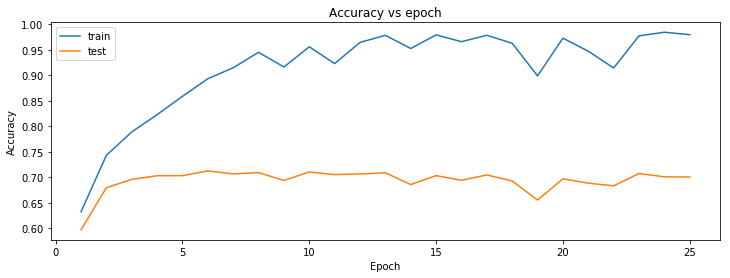

In [11]:
with open('metrics_e.pickle', 'rb') as handle:
    metrics_e = pickle.load(handle)

acc_train_list = list()
acc_test_list = list()
loss_train_list = list()
loss_test_list = list()
for i in range(len(metrics_e[0])):
    acc_train_list.append(metrics_e[0][i][1])
    acc_test_list.append(metrics_e[1][i][1])
    loss_train_list.append(metrics_e[0][i][0])
    loss_test_list.append(metrics_e[1][i][0])
    
import matplotlib.pyplot as plt    
n_epoch = list(range(1,26))
fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, loss_train_list, '-', label='train')
plt.plot(n_epoch, loss_test_list, '-', label='test')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs epoch')
plt.show()

fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, acc_train_list, '-', label='train')
plt.plot(n_epoch, acc_test_list, '-', label='test')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs epoch')
plt.show()

In [3]:
msk = np.random.rand(len(x_train)) < 0.6
x_train_S = x_train[msk]
y_train_S = y_train[msk]

In [8]:
from keras.optimizers import SGD, rmsprop
nc = 11

metrics_list_train = list()
metrics_list_val = list()
model = Sequential()
model.add(Conv2D(64, (nc, nc), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))
opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

for i in range(10):
    model.fit(x_train_S, y_train_S, batch_size=32, epochs=1, validation_data=(x_val, y_val), shuffle=True)
    metrics_list_train.append(model.evaluate(x_train_S, y_train_S))
    metrics_list_val.append(model.evaluate(x_val, y_val))

Train on 26718 samples, validate on 5007 samples
Epoch 1/1
5007/5007 [==============================] - 1s 268us/step

In [18]:
from keras.optimizers import SGD, rmsprop
nc = 17

metrics_list_train = list()
metrics_list_val = list()
model = Sequential()
model.add(Conv2D(64, (nc, nc), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (nc, nc), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))

opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

for i in range(10):
    model.fit(x_train_S, y_train_S, batch_size=32, epochs=1, validation_data=(x_val, y_val), shuffle=True)
    metrics_list_train.append(model.evaluate(x_train_S, y_train_S))
    metrics_list_val.append(model.evaluate(x_val, y_val))

Train on 26934 samples, validate on 5078 samples
Epoch 1/1
5078/5078 [==============================] - 1s 283us/step

In [21]:
#with open('metrics_f_2.pickle', 'wb') as handle:
#    pickle.dump(metrics_f_2, handle, protocol=pickle.HIGHEST_PROTOCOL)

Graficos red shallow


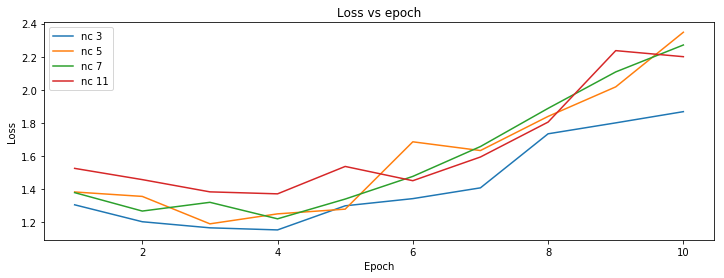

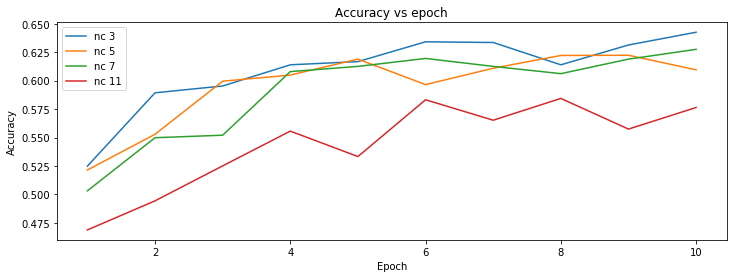

In [18]:
with open('metrics_f_1.pickle', 'rb') as handle:
    metrics_f_1 = pickle.load(handle)

loss_test = list()
acc_test = list()
for i in range(len(metrics_f_1)):
    a = list()
    b = list()
    for j in range(10):
        a.append(metrics_f_1[i][1][j][0])
        b.append(metrics_f_1[i][1][j][1])
    loss_test.append(a)
    acc_test.append(b)

    
print('Graficos red shallow')
import matplotlib.pyplot as plt    
n_epoch = list(range(1,11))
fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, loss_test[0], '-', label='nc 3')
plt.plot(n_epoch, loss_test[1], '-', label='nc 5')
plt.plot(n_epoch, loss_test[2], '-', label='nc 7')
plt.plot(n_epoch, loss_test[3], '-', label='nc 11')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs epoch')
plt.show()

fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, acc_test[0], '-', label='nc 3')
plt.plot(n_epoch, acc_test[1], '-', label='nc 5')
plt.plot(n_epoch, acc_test[2], '-', label='nc 7')
plt.plot(n_epoch, acc_test[3], '-', label='nc 11')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs epoch')
plt.show()  

Graficos red deep


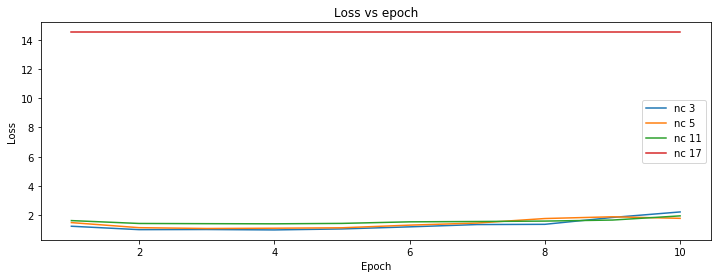

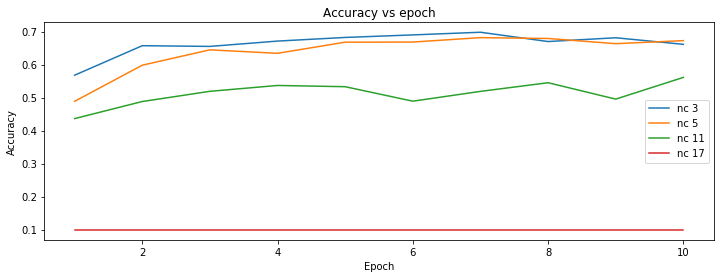

In [23]:
with open('metrics_f_2.pickle', 'rb') as handle:
    metrics_f_2 = pickle.load(handle)

loss_test = list()
acc_test = list()
for i in range(len(metrics_f_2)):
    a = list()
    b = list()
    for j in range(10):
        a.append(metrics_f_2[i][1][j][0])
        b.append(metrics_f_2[i][1][j][1])
    loss_test.append(a)
    acc_test.append(b)

print('Graficos red deep')
import matplotlib.pyplot as plt    
n_epoch = list(range(1,11))
fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, loss_test[0], '-', label='nc 3')
plt.plot(n_epoch, loss_test[1], '-', label='nc 5')
plt.plot(n_epoch, loss_test[2], '-', label='nc 11')
plt.plot(n_epoch, loss_test[3], '-', label='nc 17')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs epoch')
plt.show()

fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, acc_test[0], '-', label='nc 3')
plt.plot(n_epoch, acc_test[1], '-', label='nc 5')
plt.plot(n_epoch, acc_test[2], '-', label='nc 11')
plt.plot(n_epoch, acc_test[3], '-', label='nc 17')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs epoch')
plt.show()

In [22]:
from keras.optimizers import SGD, rmsprop
model = Sequential()
model.add(Conv2D(128, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(128, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))

opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

model.fit(x_train, y_train, batch_size=32, epochs=20, validation_data=(x_val, y_val), shuffle=True)
metrics_train = model.evaluate(x_train, y_train)
metrics_val = model.evaluate(x_val, y_val)

Train on 45138 samples, validate on 4862 samples
Epoch 1/20
45138/45138 [==============================] - 66s 1ms/step - loss: 1.4800 - acc: 0.4728 - val_loss: 1.0937 - val_acc: 0.6218

In [ ]:
#with open('metrics_g.pickle', 'wb') as handle:
    #pickle.dump(metrics_g, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [10]:
with open('metrics_g.pickle', 'rb') as handle:
    metrics_g = pickle.load(handle)

import pandas as pd
from IPython.core.display import display
tabla = pd.DataFrame(index = ['64 y 64', '64 y 128', '128 y 164'], columns=['Loss train', 'Acc train', 'Loss val', 'Acc val'])
tabla.ix[0,:] = list([metrics_g[0][1][0], metrics_g[0][1][1], metrics_g[0][2][0], metrics_g[0][2][1]])
tabla.ix[1,:] = list([metrics_g[1][1][0], metrics_g[1][1][1], metrics_g[1][2][0], metrics_g[1][2][1]])
tabla.ix[2,:] = list([metrics_g[2][1][0], metrics_g[2][1][1], metrics_g[2][2][0], metrics_g[2][2][1]])
display(tabla)

,Loss train,Acc train,Loss val,Acc val
64 y 64,0.495032,0.833734,0.762711,0.754825
64 y 128,0.674809,0.769817,0.858551,0.71123
128 y 164,0.607964,0.793367,0.858126,0.726244


In [7]:
from keras.optimizers import SGD, rmsprop
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))
model.summary()

opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

metrics_test_list = list()
for i in range(15):
    model.fit(x_train, y_train, batch_size=32, epochs=1, validation_data=(x_val, y_val), shuffle=True)
    metrics_test_list.append(model.evaluate(x_test, y_test))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 32, 32, 64)        1792      
_________________________________________________________________
activation_17 (Activation)   (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 32, 32, 64)        36928     
_________________________________________________________________
activation_18 (Activation)   (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 16, 16, 64)        36928     
_________________________________________________________________
dropout_5 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 16, 16, 64)        36928     
__________

In [6]:
from keras.optimizers import SGD, rmsprop
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))
model.summary()

opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

metrics_test_list_2 = list()
for i in range(15):
    model.fit(x_train, y_train, batch_size=32, epochs=1, validation_data=(x_val, y_val), shuffle=True)
    metrics_test_list_2.append(model.evaluate(x_test, y_test))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
activation_5 (Activation)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 64)        36928     
_________________________________________________________________
activation_6 (Activation)    (None, 32, 32, 64)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 64)        36928     
__________

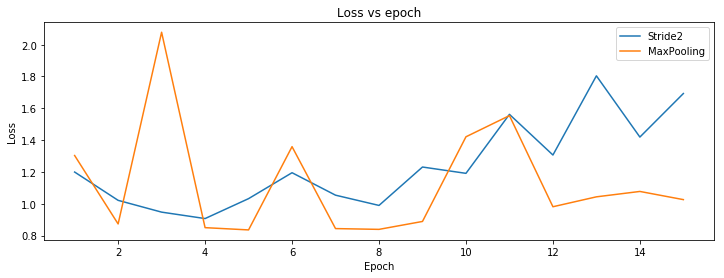

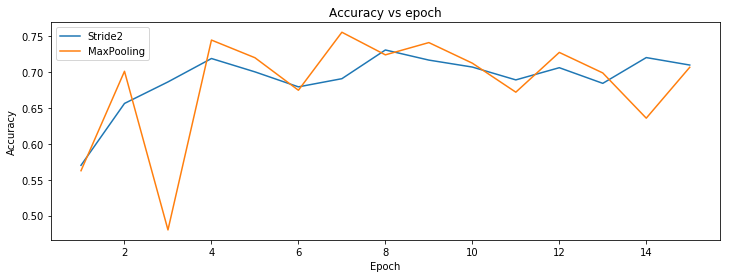

In [7]:
import pickle
with open('metrics_h.pickle', 'rb') as handle:
    metrics_h = pickle.load(handle)
    
acc_stride_list = list()
acc_pooling_list = list()
loss_stride_list = list()
loss_pooling_list = list()
for i in range(len(metrics_h[0])):
    acc_stride_list.append(metrics_h[0][i][1])
    acc_pooling_list.append(metrics_h[1][i][1])
    loss_stride_list.append(metrics_h[0][i][0])
    loss_pooling_list.append(metrics_h[1][i][0])
    
import matplotlib.pyplot as plt    
n_epoch = list(range(1,16))
fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, loss_stride_list, '-', label='Stride2')
plt.plot(n_epoch, loss_pooling_list, '-', label='MaxPooling')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs epoch')
plt.legend()
plt.show()

fig = plt.figure(figsize = (12,4))
plt.plot(n_epoch, acc_stride_list, '-', label='Stride2')
plt.plot(n_epoch, acc_pooling_list, '-', label='MaxPooling')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs epoch')
plt.legend()
plt.show()

In [26]:
from keras.optimizers import SGD, rmsprop
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))

opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

eval_train = list()
eval_val = list()
eval_test = list()

batch_size=32
epochs=1
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    featurewise_center=False, # set input mean to 0 over the dataset
    samplewise_center=False, # set each sample mean to 0
    featurewise_std_normalization=False, # divide inputs by std of the dataset
    samplewise_std_normalization=False, # divide each input by its std
    zca_whitening=False, # apply ZCA whitening
    rotation_range=0, # randomly rotate images (degrees, 0 to 180)
    width_shift_range=0.1, # randomly shift images horizontally (fraction of width)
    height_shift_range=0.1, # randomly shift images vertically (fraction of height)
    horizontal_flip=True, # randomly flip images
    vertical_flip=False) # randomly flip images
datagen.fit(x_train)
for i in range(20):
    model.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),steps_per_epoch=x_train.shape[0]// batch_size, epochs=epochs,validation_data=(x_val, y_val))
    eval_train.append(model.evaluate(x_train, y_train))
    eval_val.append(model.evaluate(x_val, y_val))
    eval_test.append(model.evaluate(x_test, y_test))

Epoch 1/1
10000/10000 [==============================] - 3s 292us/step

C:\Users\Daniel\Anaconda3\lib\site-packages\keras\callbacks.py:120: UserWarning: Method on_batch_end() is slow compared to the batch update (1.057060). Check your callbacks.
  % delta_t_median)
C:\Users\Daniel\Anaconda3\lib\site-packages\keras\callbacks.py:120: UserWarning: Method on_batch_end() is slow compared to the batch update (0.529030). Check your callbacks.
  % delta_t_median)


10000/10000 [==============================] - 3s 263us/step

MemoryError: 

In [3]:
from keras.optimizers import SGD, rmsprop
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('softmax'))

opt = rmsprop(lr=0.001, decay=1e-6)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

model.fit(x_train, y_train, batch_size=32, epochs=10, validation_data=(x_val, y_val), shuffle=True)

Train on 44931 samples, validate on 5069 samples
Epoch 1/10
44931/44931 [==============================] - 52s 1ms/step - loss: 1.5342 - acc: 0.4512 - val_loss: 1.2245 - val_acc: 0.5540

In [73]:
from sklearn.metrics import confusion_matrix
import keras

#y_pred = model.predict_classes(x_test)
with open('y_pred.pickle', 'rb') as handle:
    y_pred = pickle.load(handle)
conf_mat = confusion_matrix(y_test_n, y_pred)

import pandas as pd
from IPython.core.display import display
ind = label_names
df_conf = pd.DataFrame(data=conf_mat, index=ind, columns=ind)

malo = list()
malo2 = list()
for i in range(len(df_conf)):
    malo.append(sum(df_conf.iloc[i,:]) - df_conf.iloc[i,i])
    malo2.append(malo[i]/ sum(df_conf.iloc[:,i]))

df_conf.loc['Mal'] = malo
with pd.option_context('display.max_rows', None, 'display.max_columns', 24):
    display(df_conf)

df_per = pd.DataFrame(data = malo2, index = ind, columns=['Percentage'])
display(df_per.sort_values(by=['Percentage'], ascending=False))

,airplane,automobile,bird,cat,deer,dog,frog,horse,ship,truck
airplane,837,11,38,16,15,8,7,10,34,24
automobile,34,840,6,7,1,5,16,2,13,76
bird,80,7,579,68,81,66,68,28,9,14
cat,39,11,75,472,64,175,94,34,8,28
deer,35,4,67,66,671,32,71,44,6,4
dog,24,2,44,180,40,618,40,40,5,7
frog,12,3,39,47,19,30,827,7,9,7
horse,18,2,48,35,63,41,17,756,3,17
ship,102,39,13,18,7,4,10,2,779,26
truck,50,72,10,14,7,4,7,7,26,803


,Percentage
cat,0.572048
bird,0.458107
dog,0.388606
deer,0.339876
horse,0.262366
ship,0.247758
truck,0.195825
automobile,0.161453
frog,0.149525
airplane,0.132413


In [63]:
f = 40
print(y_pred[f])
print(y_val[f])

[ 0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
[ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
